## Mountains vs. Beaches Preferences.
This dataset aims to analyze public preferences between two popular vacation types: mountains and beaches. It provides insights into various demographic and lifestyle factors that may influence these preferences. By exploring this dataset, users can apply multiple machine learning techniques to predict whether individuals prefer mountains or beaches based on their attributes.
Features
The dataset contains the following features:

- Age: Age of the individual (numerical).
- Gender: Gender identity of the individual (categorical: male, female, non-binary).
- Income: Annual income of the individual (numerical).
- Education Level: Highest level of education attained (categorical: high school, bachelor, master, doctorate).
- Travel Frequency: Number of vacations taken per year (numerical).
- Preferred Activities: Activities preferred by individuals during vacations (categorical: hiking, swimming, skiing, sunbathing).
- Vacation Budget: Budget allocated for vacations (numerical).
- Location: Type of residence (categorical: urban, suburban, rural).
- Proximity to Mountains: Distance from the nearest mountains (numerical, in miles).
- Proximity to Beaches: Distance from the nearest beaches (numerical, in miles).
- Favorite Season: Preferred season for vacations (categorical: summer, winter, spring, fall).
- Pets: Indicates whether the individual owns pets (binary: 0 = No, 1 = Yes).
- Environmental Concerns: Indicates whether the individual has environmental concerns (binary: 0 = No, 1 = Yes).

 Let's begin by importing all the needed libraries.

In [507]:
import pandas as pd
import plotly.express as px
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Data clean up

Read the dataset and output few first rows.

In [508]:
df = pd.read_csv('mountains_vs_beaches_preferences.csv')
df.head()

,Age,Gender,Income,Education_Level,Travel_Frequency,Preferred_Activities,Vacation_Budget,Location,Proximity_to_Mountains,Proximity_to_Beaches,Favorite_Season,Pets,Environmental_Concerns,Preference
0,56,male,71477,bachelor,9,skiing,2477,urban,175,267,summer,0,1,1
1,69,male,88740,master,1,swimming,4777,suburban,228,190,fall,0,1,0
2,46,female,46562,master,0,skiing,1469,urban,71,280,winter,0,0,1
3,32,non-binary,99044,high school,6,hiking,1482,rural,31,255,summer,1,0,1
4,60,female,106583,high school,5,sunbathing,516,suburban,23,151,winter,1,1,0


Look at our data and understand whether we have to clean it or no.
What values do we have?

In [509]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52444 entries, 0 to 52443
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Age                     52444 non-null  int64 
 1   Gender                  52444 non-null  object
 2   Income                  52444 non-null  int64 
 3   Education_Level         52444 non-null  object
 4   Travel_Frequency        52444 non-null  int64 
 5   Preferred_Activities    52444 non-null  object
 6   Vacation_Budget         52444 non-null  int64 
 7   Location                52444 non-null  object
 8   Proximity_to_Mountains  52444 non-null  int64 
 9   Proximity_to_Beaches    52444 non-null  int64 
 10  Favorite_Season         52444 non-null  object
 11  Pets                    52444 non-null  int64 
 12  Environmental_Concerns  52444 non-null  int64 
 13  Preference              52444 non-null  int64 
dtypes: int64(9), object(5)
memory usage: 5.6+ MB


Objects and int64s. No nulls in the table!

In [510]:
df.isnull().sum()

Age                       0
Gender                    0
Income                    0
Education_Level           0
Travel_Frequency          0
Preferred_Activities      0
Vacation_Budget           0
Location                  0
Proximity_to_Mountains    0
Proximity_to_Beaches      0
Favorite_Season           0
Pets                      0
Environmental_Concerns    0
Preference                0
dtype: int64

As we can see there are no no NaNs in the table. Also there are no numbers written as “1M+”, “10k+”, “1k+”.

Let's check if there's any incorrect values in the data frame. For example, if there are any negative numbers.

In [511]:
df['Income'].describe()

count     52444.000000
mean      70017.271280
std       28847.560428
min       20001.000000
25%       45048.250000
50%       70167.000000
75%       95108.500000
max      119999.000000
Name: Income, dtype: float64

In [512]:
df['Travel_Frequency'].describe()

count    52444.000000
mean         4.489265
std          2.876130
min          0.000000
25%          2.000000
50%          4.000000
75%          7.000000
max          9.000000
Name: Travel_Frequency, dtype: float64

In [513]:
df['Vacation_Budget'].describe()

count    52444.000000
mean      2741.799062
std       1296.922423
min        500.000000
25%       1622.000000
50%       2733.000000
75%       3869.000000
max       4999.000000
Name: Vacation_Budget, dtype: float64

In [514]:
df['Proximity_to_Mountains'].describe()

count    52444.000000
mean       149.943502
std         86.548644
min          0.000000
25%         75.000000
50%        150.000000
75%        225.000000
max        299.000000
Name: Proximity_to_Mountains, dtype: float64

In [515]:
df['Proximity_to_Beaches'].describe()

count    52444.000000
mean       149.888452
std         86.469248
min          0.000000
25%         75.750000
50%        150.000000
75%        225.000000
max        299.000000
Name: Proximity_to_Beaches, dtype: float64

In [516]:
df['Pets'].describe()

count    52444.000000
mean         0.500858
std          0.500004
min          0.000000
25%          0.000000
50%          1.000000
75%          1.000000
max          1.000000
Name: Pets, dtype: float64

In [517]:
df['Environmental_Concerns'].describe()

count    52444.000000
mean         0.498436
std          0.500002
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: Environmental_Concerns, dtype: float64

In [518]:
df['Preference'].describe()

count    52444.000000
mean         0.250706
std          0.433423
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: Preference, dtype: float64

Looks good!

# Overview

Here's statistics.

In [519]:
cols = ['Age', 'Income', 'Travel_Frequency', 'Vacation_Budget', 'Proximity_to_Mountains', 'Proximity_to_Beaches']
df[cols].describe()

,Age,Income,Travel_Frequency,Vacation_Budget,Proximity_to_Mountains,Proximity_to_Beaches
count,52444.000000,52444.000000,52444.000000,52444.000000,52444.000000,52444.000000
mean,43.507360,70017.271280,4.489265,2741.799062,149.943502,149.888452
std,14.985597,28847.560428,2.876130,1296.922423,86.548644,86.469248
min,18.000000,20001.000000,0.000000,500.000000,0.000000,0.000000
25%,31.000000,45048.250000,2.000000,1622.000000,75.000000,75.750000
50%,43.000000,70167.000000,4.000000,2733.000000,150.000000,150.000000
75%,56.000000,95108.500000,7.000000,3869.000000,225.000000,225.000000
max,69.000000,119999.000000,9.000000,4999.000000,299.000000,299.000000


here's what our data looks like.

Let's look at preference distribution.

In [520]:
df['Preference_Words'] = df['Preference'].map({1: 'Mountains', 0: 'Beaches'})
fig = px.pie(df,
             names='Preference_Words',
             title='Preference Distribution',
             color_discrete_sequence=['rgb(50, 168, 82)', 'rgb(245, 110, 124)']
             )
fig.show()

This pie-chart shows us that there are more people choosing beaches than people who choose mountains.Now let's look at how gender impact on the preference.

In [521]:

gender_preference_counts = df.groupby(['Gender', 'Preference_Words']).size().reset_index(name='Count')

fig = px.bar(
    gender_preference_counts, 
    x='Gender', 
    y='Count', 
    color='Preference_Words', 
    barmode='group',
    title='Gender Impact on Mountain vs Beaches Preferences',
    color_discrete_sequence=['rgb(50, 168, 82)', 'rgb(245, 110, 124)']
)
fig.show()


Preference distribution looks almost the same for any gender.

Here's the income and vacational budget distribution for our dataset.

In [522]:
income_counts = df.groupby(['Income']).size().reset_index(name='Count')

fig = px.histogram(income_counts,
                   x="Income",
                   y="Count"
                   )
fig.show()

The quantity of people with different incomes is more over the same within the given range (20,000 to 120,000), with no significant skew or outliers.

In [523]:
income_counts = df.groupby(['Vacation_Budget']).size().reset_index(name='Count')

fig = px.histogram(income_counts,
                   x="Vacation_Budget",
                   y="Count"
                   )
fig.show()

The vacation budget seems to be evenly distributed as well within the given range from 1,000 to 5,000.

What are the median incomes of people who choose mountains and people who choose beaches?

In [524]:

median_income_beaches = df[df['Preference_Words'] == 'Beaches']['Income'].median()
median_income_mountains = df[df['Preference_Words'] == 'Mountains']['Income'].median()

print(f"Median income for people who prefer Beaches: {median_income_beaches}")
print(f"Median income for people who prefer Mountains: {median_income_mountains}")


Median income for people who prefer Beaches: 70317.5
Median income for people who prefer Mountains: 69608.0


Median incomes are more over the same for any preference.

# More detailed overview

Now, let's look at how proximity to either beaches or mountains influences preferences of people with different educational levels.
First let's look at people with high educational level such as doctrate and master.

In [525]:

fig = px.scatter(df[(df['Education_Level'] == 'doctorate') | (df['Education_Level'] == 'master')],
                 x="Proximity_to_Mountains",
                 y="Proximity_to_Beaches",
                 color='Preference_Words',
                 color_discrete_sequence=['rgb(50, 168, 82)', 'rgb(245, 110, 124)'])
fig.show()

Insights:
1. Most people will choose beaches.
2. Less people will choose beaches if mountains are closer than beaches.
3. People choose mountain only if they are closer than beaches.

People with lower educational level:

In [526]:
fig = px.scatter(df[(df['Education_Level'] == 'high school') | (df['Education_Level'] == 'bachelor')],
                 x="Proximity_to_Mountains",
                 y="Proximity_to_Beaches",
                 color='Preference_Words',
                 color_discrete_sequence=['rgb(50, 168, 82)', 'rgb(245, 110, 124)'],
                 category_orders={'Preference_Words': ['Beaches', 'Mountains']}
                 )
fig.show()

We get the same results for people with lower educational level. Thus, we can conclude that the relationship between the educational level and preference is not significant. What is closer to people influences their choice the most.

For a more detailed analysis we can look at each of the categories one by one.

In [527]:
fig = px.scatter(df,
                 x="Proximity_to_Mountains",
                 y="Proximity_to_Beaches",
                 color='Preference_Words',
                 symbol="Education_Level",
                 color_discrete_sequence=['rgb(50, 168, 82)', 'rgb(245, 110, 124)'],
                 category_orders={'Preference_Words': ['Beaches', 'Mountains']}
                 )
fig.show()

It is worth to mention that individuals tend to select mountains as their preferred destination only when they are situated closer to them than beaches.

In [528]:
df['Income_Category'] = pd.qcut(df['Income'], q=5, labels=['low income', 'low-middle income', 'middle income', 'high-middle income', 'high income'])

df['Budget_Category'] = pd.qcut(df['Vacation_Budget'], q=5, labels=['low budget', 'low-middle budget', 'middle budget', 'high-middle budget', 'high budget'])

In [529]:
df.head()

,Age,Gender,Income,Education_Level,Travel_Frequency,Preferred_Activities,Vacation_Budget,Location,Proximity_to_Mountains,Proximity_to_Beaches,Favorite_Season,Pets,Environmental_Concerns,Preference,Preference_Words,Income_Category,Budget_Category
0,56,male,71477,bachelor,9,skiing,2477,urban,175,267,summer,0,1,1,Mountains,middle income,middle budget
1,69,male,88740,master,1,swimming,4777,suburban,228,190,fall,0,1,0,Beaches,high-middle income,high budget
2,46,female,46562,master,0,skiing,1469,urban,71,280,winter,0,0,1,Mountains,low-middle income,low-middle budget
3,32,non-binary,99044,high school,6,hiking,1482,rural,31,255,summer,1,0,1,Mountains,high-middle income,low-middle budget
4,60,female,106583,high school,5,sunbathing,516,suburban,23,151,winter,1,1,0,Beaches,high income,low budget


In [530]:
pivot_table = pd.pivot_table(df, index=['Income_Category'],
    columns=['Budget_Category'], values="Preference", aggfunc="mean")
pivot_table = pivot_table.round(3)
pivot_table

/var/folders/sm/vq9prjp12l38ft45p9dmpr_80000gn/T/ipykernel_5434/1760143896.py:1: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



Budget_Category,low budget,low-middle budget,middle budget,high-middle budget,high budget
Income_Category,,,,,
low income,0.249,0.250,0.260,0.242,0.260
low-middle income,0.260,0.267,0.239,0.240,0.243
middle income,0.259,0.249,0.236,0.254,0.261
high-middle income,0.248,0.258,0.246,0.245,0.251
high income,0.243,0.268,0.257,0.229,0.253


This table calculates the percentage of people in each income-budget group who prefer mountains. Thus the repcentage of people who prefer beaches for each group will be (100 - income-budget group %).

1. Preferences for mountains vs beaches are fairly balanced across all income-budget groups, with values flactuating between 0.23 and 0.27.
This proves that neither income nor budget is a strong determinant of vacation preferences.
2. There are some changes, but it’s quite small, so it’s not clear whether it’s significant or not.

In [531]:
mountains_df = df[df['Preference_Words'] == 'Mountains']
fig1 = px.density_heatmap(mountains_df, 
                         x="Income", 
                         y="Vacation_Budget",
                         title="Density Heatmap of Income and Vacation Budget for Mountains Preference",
                         marginal_x="histogram", 
                         marginal_y="histogram")

fig1.show()

beaches_df = df[df['Preference_Words'] == 'Beaches']
fig2 = px.density_heatmap(beaches_df, 
                        x="Income", 
                        y="Vacation_Budget",
                        title="Density Heatmap of Income and Vacation Budget for Beaches Preference",
                        marginal_x="histogram", 
                        marginal_y="histogram")

fig2.show()


Looking at this heatmaps together, we can make few conlusions.
- Distribution is more uniform across income levels on the density heatmap for people who prefer beaches. It happens due to a broader appeal of beaches compared to mountains, potentially because of accessibility or popularity.
- There are about 3 times more people with high income (115k - 120k) who prefer beaches than those who have the same income but choose mountains.

/var/folders/sm/vq9prjp12l38ft45p9dmpr_80000gn/T/ipykernel_5434/890747739.py:12: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



Vacation_Budget_Bin  495\$ - 949\$  949\$ - 1399\$  1399\$ - 1849\$  \
Income_Bin                                                            
19903\$ - 30002\$              128             114              131   
30002\$ - 40001\$              136             135              144   
40001\$ - 50000\$              148             150              137   
50000\$ - 59999\$              119             144              152   
59999\$ - 69999\$              150             113              135   
69999\$ - 79998\$              137             137              121   
79998\$ - 89997\$              103             139              135   
89997\$ - 99996\$              132             152              140   
99996\$ - 109995\$             141             135              150   
109995\$ - 119995\$            122             116              146   

Vacation_Budget_Bin  1849\$ - 2299\$  2299\$ - 2749\$  2749\$ - 3199\$  \
Income_Bin                                                               

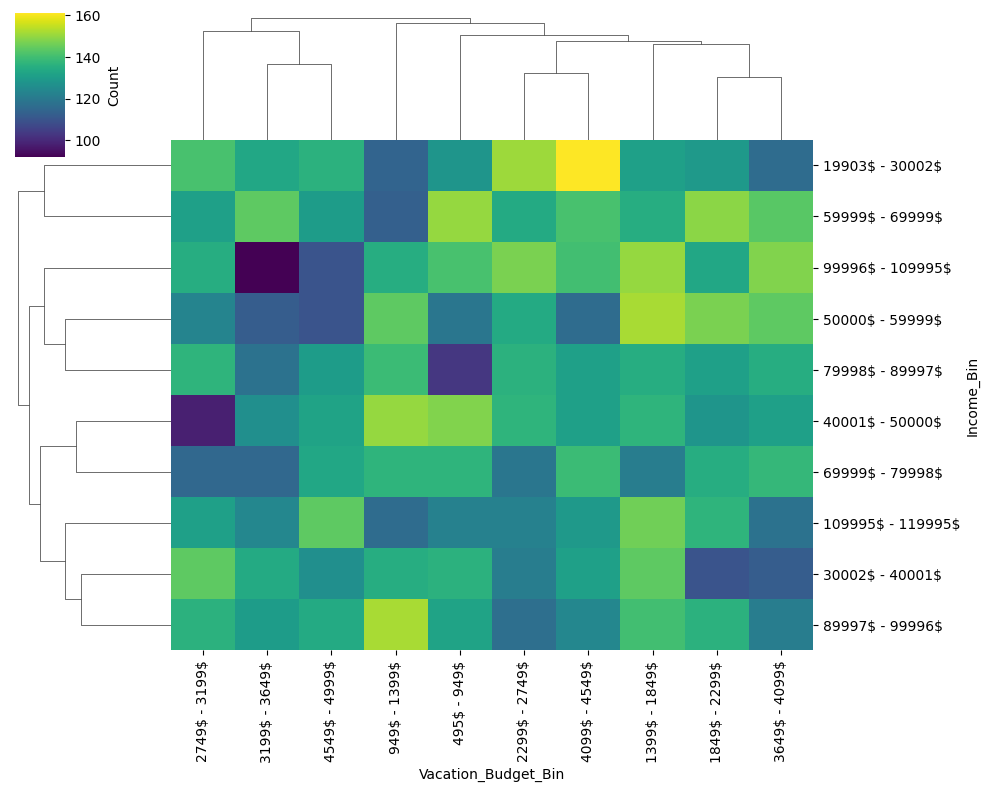

In [532]:
mountains_df = df[df['Preference_Words'] == 'Mountains'].copy()

income_bins = pd.cut(mountains_df['Income'], bins=10)
budget_bins = pd.cut(mountains_df['Vacation_Budget'], bins=10)

income_bin_labels = [f"{int(i.left)}\\$ - {int(i.right)}\\$" for i in income_bins.cat.categories]
budget_bin_labels = [f"{int(i.left)}\\$ - {int(i.right)}\\$" for i in budget_bins.cat.categories]

mountains_df['Income_Bin'] = pd.cut(mountains_df['Income'], bins=10, labels=income_bin_labels)
mountains_df['Vacation_Budget_Bin'] = pd.cut(mountains_df['Vacation_Budget'], bins=10, labels=budget_bin_labels)

pivot_table = mountains_df.pivot_table(
    index='Income_Bin', 
    columns='Vacation_Budget_Bin', 
    values='Income',
    aggfunc='count',
    fill_value=0
)
print(pivot_table)
sns.clustermap(
    pivot_table,
    cmap="viridis",
    figsize=(10, 8),
    linewidths=0,
    cbar_kws={'label': 'Count'}
)

Here's a cluster map for people who prefer mountains. This is what we can couclude from it.
- People with higher income tend to choose a higher vacation budget.
- Lower budgets are usually chosen by people with lower or middle income.

Let's look at what actually influences the preference of the people.

In [533]:
df_copy = df.copy()
df_copy = df_copy.drop(columns=['Preference_Words'])
df_copy = df_copy.drop(columns=['Income_Category'])
df_copy = df_copy.drop(columns=['Budget_Category'])

categorical_cols = df_copy.select_dtypes(include='object').columns
le = LabelEncoder()

for col in categorical_cols:
    df_copy[col] = le.fit_transform(df[col])

correlation_matrix = df_copy.corr()

fig = px.imshow(
    correlation_matrix,
    text_auto='.2f',
    color_continuous_scale='magma', 
    labels={'color': 'Correlation'},
    title="Correlation Heatmap"
)

fig.update_layout(
    title_x=0.5,
    width=1000,
    height=800,
)

fig.show()


As we see factors that affect preferences the most are prefered activities and proximity to both beaches and mountains.

Now, let's look at how preferd activities impact on the choice.

In [534]:
cols = [ "Proximity_to_Mountains","Proximity_to_Beaches" ,"Preferred_Activities","Preference_Words" ]
dfff = df[cols]#.groupby(["Preference_Words",  "Preferred_Activities"], as_index=False).count()
pref = ['Mountains', 'Beaches']
act = ['skiing', 'hiking', 'swimming', 'sunbathing']
for activity in act:
        fig = px.scatter(df[(df['Preferred_Activities'] == activity)], x="Proximity_to_Mountains", y="Proximity_to_Beaches", color="Preference_Words", symbol="Preferred_Activities")
        fig.show()

Here's what these graphs show us:
1. Choice of people who enjoy skiing depends on proximity, they will most likely choose what is closer to them.
2. Choice of people who's hobby is hiking also depends on proximity, they probably will choose what is closer to them.
2. People who like swimming choose only beaches.
4. Same goes for people who prefer sunbathing, they all choose beaches.

# Hypothesis:
"Individuals with higher incomes and vacation budgets who travel frequently are more likely to prefer beaches over mountains, while those with lower incomes and vacation budgets but similar travel frequency prefer mountains. Gender differences may amplify this trend."

In [535]:
df['Income_Category'] = pd.qcut(df['Income'], q=3, labels=['Low Income', 'Medium Income', 'High Income'])

df['Budget_Category'] = pd.qcut(df['Vacation_Budget'], q=3, labels=['Low Budget', 'Medium Budget', 'High Budget'])

df['Travel_Frequency_Category'] = pd.qcut(df['Travel_Frequency'], q=3, labels=['Rarely', 'Sometimes', 'Often'])

df.head()

,Age,Gender,Income,Education_Level,Travel_Frequency,Preferred_Activities,Vacation_Budget,Location,Proximity_to_Mountains,Proximity_to_Beaches,Favorite_Season,Pets,Environmental_Concerns,Preference,Preference_Words,Income_Category,Budget_Category,Travel_Frequency_Category
0,56,male,71477,bachelor,9,skiing,2477,urban,175,267,summer,0,1,1,Mountains,Medium Income,Medium Budget,Often
1,69,male,88740,master,1,swimming,4777,suburban,228,190,fall,0,1,0,Beaches,High Income,High Budget,Rarely
2,46,female,46562,master,0,skiing,1469,urban,71,280,winter,0,0,1,Mountains,Low Income,Low Budget,Rarely
3,32,non-binary,99044,high school,6,hiking,1482,rural,31,255,summer,1,0,1,Mountains,High Income,Low Budget,Sometimes
4,60,female,106583,high school,5,sunbathing,516,suburban,23,151,winter,1,1,0,Beaches,High Income,Low Budget,Sometimes


In [536]:
grouped_data = df.groupby(['Income_Category', 'Budget_Category', 'Travel_Frequency_Category', 'Preference_Words']).size().reset_index(name='Count')

pivot_data = grouped_data.pivot_table(
    index=['Income_Category', 'Budget_Category', 'Travel_Frequency_Category'],
    columns=['Preference_Words'],
    values='Count',
    fill_value=0
)


print(pivot_data)


Preference_Words                                           Beaches  Mountains
Income_Category Budget_Category Travel_Frequency_Category                    
Low Income      Low Budget      Rarely                      1732.0      634.0
                                Sometimes                   1292.0      445.0
                                Often                       1303.0      418.0
                Medium Budget   Rarely                      1723.0      581.0
                                Sometimes                   1301.0      451.0
                                Often                       1333.0      430.0
                High Budget     Rarely                      1766.0      585.0
                                Sometimes                   1354.0      445.0
                                Often                       1275.0      413.0
Medium Income   Low Budget      Rarely                      1722.0      585.0
                                Sometimes                   1319

/var/folders/sm/vq9prjp12l38ft45p9dmpr_80000gn/T/ipykernel_5434/2963531452.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/var/folders/sm/vq9prjp12l38ft45p9dmpr_80000gn/T/ipykernel_5434/2963531452.py:3: FutureWarning:

The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior



In [537]:
fig = px.bar(
    grouped_data, 
    x='Income_Category', 
    y='Count', 
    color='Preference_Words', 
    facet_col='Budget_Category', 
    facet_row='Travel_Frequency_Category', 
    barmode='group', 
    title='Preference Analysis by Income, Budget, Travel Frequency, and Gender', 
    color_discrete_sequence=['rgb(50, 168, 82)', 'rgb(245, 110, 124)'], 
    text='Count',
    height=800,
    width=1000
)
fig.update_layout(
    xaxis_title="Income Category",
    yaxis_title="Count",
    showlegend=True,
    font=dict(size=10),
)
fig.show()



In [538]:
grouped_data = df.groupby(['Income_Category', 'Budget_Category', 'Travel_Frequency_Category', 'Gender', 'Preference_Words']).size().reset_index(name='Count')

fig = px.bar(
    grouped_data, 
    x='Income_Category', 
    y='Count', 
    color='Preference_Words',
    pattern_shape='Gender',
    facet_col='Budget_Category', 
    facet_row='Travel_Frequency_Category', 
    barmode='group', 
    title='Preference Analysis by Income, Budget, Travel Frequency, and Gender', 
    color_discrete_sequence=['rgb(50, 168, 82)', 'rgb(245, 110, 124)'], 
    category_orders={
        'Income_Category': ['Low Income', 'Medium Income', 'High Income'],
        'Budget_Category': ['Low Budget', 'Medium Budget', 'High Budget'],
        'Travel_Frequency_Category': ['Rarely', 'Sometimes', 'Often'],
        'Gender': ['Male', 'Female'],
        'Preference_Words': ['Mountains', 'Beaches']
    },
    height=1000,
    width=1200
)

fig.update_layout(
    xaxis_title="Income Category",
    yaxis_title="Count",
    showlegend=True,
    font=dict(size=10),
    xaxis_tickangle=-45,
    legend_title_text='Preference and Gender',
    barmode='group'
)

# Update legend to show both color and pattern
fig.for_each_trace(lambda t: t.update(name=t.name + " - " + t.legendgroup))

fig.show()

/var/folders/sm/vq9prjp12l38ft45p9dmpr_80000gn/T/ipykernel_5434/4006089282.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [539]:
stats = df.groupby(['Income_Category', 'Budget_Category', 'Travel_Frequency_Category', 'Preference_Words']).agg(
    Mean_Income=('Income', 'mean'),
    Median_Income=('Income', 'median'),
    Mean_Budget=('Vacation_Budget', 'mean'),
    Median_Budget=('Vacation_Budget', 'median')
).reset_index()

print(stats)


   Income_Category Budget_Category Travel_Frequency_Category Preference_Words  \
0       Low Income      Low Budget                    Rarely          Beaches   
1       Low Income      Low Budget                    Rarely        Mountains   
2       Low Income      Low Budget                 Sometimes          Beaches   
3       Low Income      Low Budget                 Sometimes        Mountains   
4       Low Income      Low Budget                     Often          Beaches   
5       Low Income      Low Budget                     Often        Mountains   
6       Low Income   Medium Budget                    Rarely          Beaches   
7       Low Income   Medium Budget                    Rarely        Mountains   
8       Low Income   Medium Budget                 Sometimes          Beaches   
9       Low Income   Medium Budget                 Sometimes        Mountains   
10      Low Income   Medium Budget                     Often          Beaches   
11      Low Income   Medium 

/var/folders/sm/vq9prjp12l38ft45p9dmpr_80000gn/T/ipykernel_5434/3128519691.py:1: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



So, as we can see, it is indeed true that individuals with higher incomes and vacation budgets who travel frequently are more likely to prefer beaches over mountains. However the second part of the hypothesis is not supported by the data. Individuals with lower incomes and vacation budgets but similar travel frequency tend to choose beaches as well.

# Data transformation

In [540]:
df['Income_to_Budget_Ratio'] = df['Income'] / df['Vacation_Budget']
df.head()

,Age,Gender,Income,Education_Level,Travel_Frequency,Preferred_Activities,Vacation_Budget,Location,Proximity_to_Mountains,Proximity_to_Beaches,Favorite_Season,Pets,Environmental_Concerns,Preference,Preference_Words,Income_Category,Budget_Category,Travel_Frequency_Category,Income_to_Budget_Ratio
0,56,male,71477,bachelor,9,skiing,2477,urban,175,267,summer,0,1,1,Mountains,Medium Income,Medium Budget,Often,28.856278
1,69,male,88740,master,1,swimming,4777,suburban,228,190,fall,0,1,0,Beaches,High Income,High Budget,Rarely,18.576512
2,46,female,46562,master,0,skiing,1469,urban,71,280,winter,0,0,1,Mountains,Low Income,Low Budget,Rarely,31.696392
3,32,non-binary,99044,high school,6,hiking,1482,rural,31,255,summer,1,0,1,Mountains,High Income,Low Budget,Sometimes,66.831309
4,60,female,106583,high school,5,sunbathing,516,suburban,23,151,winter,1,1,0,Beaches,High Income,Low Budget,Sometimes,206.556202


In [541]:
bins = [0, 25, 45, 65, 100]
labels = ['Youth', 'Adult', 'Middle-aged', 'Senior']
df['Age_Group'] = pd.cut(df['Age'], bins=bins, labels=labels)
df.head()

,Age,Gender,Income,Education_Level,Travel_Frequency,Preferred_Activities,Vacation_Budget,Location,Proximity_to_Mountains,Proximity_to_Beaches,Favorite_Season,Pets,Environmental_Concerns,Preference,Preference_Words,Income_Category,Budget_Category,Travel_Frequency_Category,Income_to_Budget_Ratio,Age_Group
0,56,male,71477,bachelor,9,skiing,2477,urban,175,267,summer,0,1,1,Mountains,Medium Income,Medium Budget,Often,28.856278,Middle-aged
1,69,male,88740,master,1,swimming,4777,suburban,228,190,fall,0,1,0,Beaches,High Income,High Budget,Rarely,18.576512,Senior
2,46,female,46562,master,0,skiing,1469,urban,71,280,winter,0,0,1,Mountains,Low Income,Low Budget,Rarely,31.696392,Middle-aged
3,32,non-binary,99044,high school,6,hiking,1482,rural,31,255,summer,1,0,1,Mountains,High Income,Low Budget,Sometimes,66.831309,Adult
4,60,female,106583,high school,5,sunbathing,516,suburban,23,151,winter,1,1,0,Beaches,High Income,Low Budget,Sometimes,206.556202,Middle-aged
